## Disease Prediction

#### Dataset Link : https://www.kaggle.com/datasets/ehababoelnaga/multiple-disease-prediction

### Loading the dataset

In [1]:
#importing the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

E:\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
E:\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
#loading of dataset from the link
dataset = pd.read_csv("Blood_samples_dataset_balanced_2(f).csv")
dataset

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230,Healthy
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166,Diabetes
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208,Thalasse
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094,Anemia
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970,Thalasse
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2346,0.012956,0.336925,0.451218,0.175006,0.734664,0.382770,0.656463,0.177502,0.808162,0.684499,...,0.670665,0.311568,0.595083,0.155866,0.885812,0.636125,0.132226,0.716519,0.006121,Diabetes
2347,0.407101,0.124738,0.983306,0.663867,0.361113,0.663716,0.232516,0.341056,0.847441,0.309766,...,0.491185,0.701914,0.218104,0.790341,0.570902,0.339125,0.310964,0.310900,0.622403,Thalasse
2348,0.344356,0.783918,0.582171,0.996841,0.065363,0.242885,0.658851,0.543017,0.290106,0.838722,...,0.141738,0.155871,0.473638,0.250535,0.387197,0.344728,0.606719,0.395145,0.134021,Anemia
2349,0.351722,0.014278,0.898615,0.167550,0.727148,0.046091,0.900434,0.136227,0.134361,0.279219,...,0.570553,0.171245,0.858352,0.362012,0.290984,0.996873,0.882164,0.411158,0.146255,Diabetes


In [3]:
# show the rows and columns of dataset
dataset.shape

(2351, 25)

In [4]:
dataset1 = pd.read_csv("blood_samples_dataset_test.csv")
dataset1

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.001827,0.033693,0.114755,0.997927,0.562604,0.866499,0.578042,0.914615,0.026864,0.038641,...,0.653230,0.186104,0.430398,0.016678,0.885352,0.652733,0.788235,0.054788,0.031313,Thalasse
1,0.436679,0.972653,0.084998,0.180909,0.675736,0.563889,0.798382,0.670361,0.376092,0.184890,...,0.833540,0.153001,0.458533,0.401845,0.635969,0.574425,0.047025,0.607985,0.594123,Diabetes
2,0.545697,0.324815,0.584467,0.475748,0.558596,0.661007,0.934056,0.381782,0.500342,0.531829,...,0.678901,0.220479,0.817151,0.690981,0.101633,0.855740,0.551124,0.413294,0.070909,Heart Di
3,0.172994,0.050351,0.736000,0.782022,0.069435,0.085219,0.032907,0.460619,0.785448,0.491495,...,0.381500,0.459396,0.420154,0.798537,0.399236,0.324600,0.499504,0.436662,0.242766,Diabetes
4,0.758534,0.739968,0.597868,0.772683,0.875720,0.860265,0.486189,0.486686,0.621048,0.191756,...,0.993381,0.272338,0.663579,0.265227,0.918847,0.804910,0.571119,0.188368,0.750848,Heart Di
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,0.985163,0.412960,0.529993,0.263765,0.431288,0.198882,0.581289,0.701192,0.249410,0.246893,...,0.680556,0.048191,0.465272,0.066511,0.965544,0.015051,0.442730,0.196986,0.816038,Diabetes
482,0.581914,0.629325,0.491644,0.901473,0.347797,0.633286,0.698114,0.516947,0.674259,0.798153,...,0.261767,0.482322,0.799523,0.807460,0.325313,0.825194,0.777866,0.415987,0.842804,Heart Di
483,0.066669,0.404558,0.591041,0.228401,0.127461,0.026670,0.847444,0.279740,0.575425,0.156438,...,0.168146,0.763625,0.677782,0.890501,0.638825,0.559993,0.795478,0.669925,0.124874,Anemia
484,0.901444,0.430680,0.243853,0.825551,0.493884,0.726299,0.660930,0.445560,0.349782,0.343069,...,0.893448,0.500059,0.112250,0.548469,0.211496,0.938355,0.463381,0.862921,0.658526,Diabetes


In [5]:
dataset1.shape

(486, 25)

In [6]:
#concatting the dataset into single dataset
df1 = pd.concat([dataset,dataset1])
df1.head()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230,Healthy
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166,Diabetes
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208,Thalasse
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094,Anemia
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970,Thalasse


In [7]:
#converting of dataset in pandas dataframe
pd.DataFrame(df1).to_csv('dataset.csv', index=None)  

In [8]:
# read the data
df = pd.read_csv('dataset.csv')

In [9]:
df

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230,Healthy
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166,Diabetes
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208,Thalasse
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094,Anemia
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970,Thalasse
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2832,0.985163,0.412960,0.529993,0.263765,0.431288,0.198882,0.581289,0.701192,0.249410,0.246893,...,0.680556,0.048191,0.465272,0.066511,0.965544,0.015051,0.442730,0.196986,0.816038,Diabetes
2833,0.581914,0.629325,0.491644,0.901473,0.347797,0.633286,0.698114,0.516947,0.674259,0.798153,...,0.261767,0.482322,0.799523,0.807460,0.325313,0.825194,0.777866,0.415987,0.842804,Heart Di
2834,0.066669,0.404558,0.591041,0.228401,0.127461,0.026670,0.847444,0.279740,0.575425,0.156438,...,0.168146,0.763625,0.677782,0.890501,0.638825,0.559993,0.795478,0.669925,0.124874,Anemia
2835,0.901444,0.430680,0.243853,0.825551,0.493884,0.726299,0.660930,0.445560,0.349782,0.343069,...,0.893448,0.500059,0.112250,0.548469,0.211496,0.938355,0.463381,0.862921,0.658526,Diabetes


In [10]:
# shows rows and columns of dataset
df.shape

(2837, 25)

In [11]:
df.columns

Index(['Glucose', 'Cholesterol', 'Hemoglobin', 'Platelets',
       'White Blood Cells', 'Red Blood Cells', 'Hematocrit',
       'Mean Corpuscular Volume', 'Mean Corpuscular Hemoglobin',
       'Mean Corpuscular Hemoglobin Concentration', 'Insulin', 'BMI',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'Triglycerides',
       'HbA1c', 'LDL Cholesterol', 'HDL Cholesterol', 'ALT', 'AST',
       'Heart Rate', 'Creatinine', 'Troponin', 'C-reactive Protein',
       'Disease'],
      dtype='object')

In [12]:
#basic information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2837 entries, 0 to 2836
Data columns (total 25 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Glucose                                    2837 non-null   float64
 1   Cholesterol                                2837 non-null   float64
 2   Hemoglobin                                 2837 non-null   float64
 3   Platelets                                  2837 non-null   float64
 4   White Blood Cells                          2837 non-null   float64
 5   Red Blood Cells                            2837 non-null   float64
 6   Hematocrit                                 2837 non-null   float64
 7   Mean Corpuscular Volume                    2837 non-null   float64
 8   Mean Corpuscular Hemoglobin                2837 non-null   float64
 9   Mean Corpuscular Hemoglobin Concentration  2837 non-null   float64
 10  Insulin                 

In [13]:
#checking of null values
df.isnull().sum() 
#there is no null values

Glucose                                      0
Cholesterol                                  0
Hemoglobin                                   0
Platelets                                    0
White Blood Cells                            0
Red Blood Cells                              0
Hematocrit                                   0
Mean Corpuscular Volume                      0
Mean Corpuscular Hemoglobin                  0
Mean Corpuscular Hemoglobin Concentration    0
Insulin                                      0
BMI                                          0
Systolic Blood Pressure                      0
Diastolic Blood Pressure                     0
Triglycerides                                0
HbA1c                                        0
LDL Cholesterol                              0
HDL Cholesterol                              0
ALT                                          0
AST                                          0
Heart Rate                                   0
Creatinine   

In [14]:
# statistical description 
df.describe()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,Triglycerides,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein
count,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,...,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000
mean,0.384621,0.413031,0.568941,0.508157,0.510863,0.506205,0.506106,0.496309,0.488859,0.551795,...,0.395643,0.447721,0.435470,0.536118,0.446217,0.460282,0.567101,0.440572,0.464101,0.445221
std,0.262080,0.251023,0.278908,0.301621,0.279597,0.273070,0.287049,0.276560,0.310724,0.277234,...,0.266795,0.269223,0.260077,0.274450,0.271631,0.253810,0.260580,0.242565,0.259814,0.254098
min,0.001827,0.003088,0.000719,0.000006,-0.000206,0.000552,0.004556,0.000309,-0.000614,0.000719,...,0.001885,-0.000991,0.001036,-0.000546,-0.000312,0.002047,0.002145,0.008831,0.005714,-0.000991
25%,0.141529,0.223545,0.325035,0.202496,0.259467,0.258357,0.288132,0.287532,0.217207,0.319725,...,0.189918,0.188792,0.231304,0.296264,0.214581,0.239659,0.335346,0.214560,0.288961,0.199513
50%,0.357817,0.397638,0.597916,0.533962,0.527381,0.467431,0.493428,0.461418,0.448926,0.583470,...,0.335778,0.466375,0.424560,0.512941,0.389440,0.486317,0.599542,0.428713,0.465957,0.489070
75%,0.596150,0.603341,0.791215,0.771727,0.744950,0.743670,0.753657,0.722293,0.778160,0.741381,...,0.597671,0.670665,0.619900,0.779378,0.715823,0.620868,0.800666,0.645247,0.684140,0.633088
max,0.991742,0.999606,0.997876,0.999507,0.999646,1.000000,1.000857,0.996362,0.999234,0.999666,...,0.999826,0.999265,0.999567,1.000744,1.000326,1.000402,0.999857,0.999348,1.000125,0.999488


## Exploratory data analysis (EDA)

#### The feature used in this dataset and it's description or the (Blood parameters):
1. Cholesterol: This is the level of cholesterol in the blood, measured in milligrams per deciliter (mg/dL).
2. Hemoglobin: This is the protein in red blood cells that carries oxygen from the lungs to the rest of the body
3. Platelets: Platelets are blood cells that help with clotting
4. White Blood Cells (WBC): These are cells of the immune system that help fight infections
5. Red Blood Cells (RBC): These are the cells that carry oxygen from the lungs to the rest of the body
6. Hematocrit: This is the percentage of blood volume that is occupied by red blood cells
7. Mean Corpuscular Volume (MCV): This is the average volume of red blood cells
8. Mean Corpuscular Hemoglobin (MCH): This is the average amount of hemoglobin in a red blood cell
9. Mean Corpuscular Hemoglobin Concentration (MCHC): This is the average concentration of hemoglobin in a red blood cell
10. Insulin: This is a hormone that helps regulate blood sugar levels
11. BMI (Body Mass Index): This is a measure of body fat based on height and weight
12. Systolic Blood Pressure (SBP): This is the pressure in the arteries when the heart beats
13. Diastolic Blood Pressure (DBP): This is the pressure in the arteries when the heart is at rest between beats
14. Triglycerides: These are a type of fat found in the blood, measured in milligrams per deciliter (mg/dL)
15. HbA1c (Glycated Hemoglobin): This is a measure of average blood sugar levels over the past two to three months
16. LDL (Low-Density Lipoprotein) Cholesterol: This is the "bad" cholesterol that can build up in the arteries
17. HDL (High-Density Lipoprotein) Cholesterol: This is the "good" cholesterol that helps remove LDL cholesterol from the arteries
18. ALT (Alanine Aminotransferase): This is an enzyme found primarily in the liver
19. AST (Aspartate Aminotransferase): This is an enzyme found in various tissues including the liver and heart
20. Heart Rate: This is the number of heartbeats per minute (bpm)
21. Creatinine: This is a waste product produced by muscles and filtered out of the blood by the kidneys
22. Troponin: This is a protein released into the bloodstream when there is damage to the heart muscle
23. C-reactive Protein (CRP): This is a marker of inflammation in the body
24. Disease: This indicates whether he has a specific disease or not.

In [15]:
#target variables
df.Disease.value_counts()

Disease
Diabetes    834
Anemia      707
Healthy     561
Thalasse    557
Thromboc    139
Heart Di     39
Name: count, dtype: int64

In [16]:
df['Disease'].replace({"Thalasse":"Thalassemia","Thromboc":"Thrombocytopaenia","Heart Di":"Heart Disease"},inplace=True)

In [17]:
df.Disease.value_counts()

Disease
Diabetes             834
Anemia               707
Healthy              561
Thalassemia          557
Thrombocytopaenia    139
Heart Disease         39
Name: count, dtype: int64

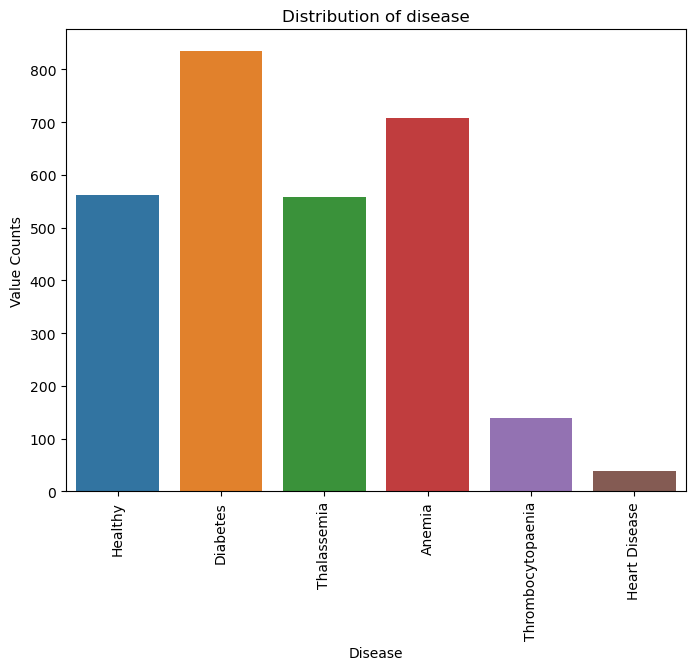

In [18]:
#target variable and their counts
plt.subplots(figsize=(8, 6))
sns.countplot(x='Disease',data=df, hue = 'Disease')
plt.title('Distribution of disease')
plt.xlabel('Disease')
plt.ylabel('Value Counts')
plt.xticks(rotation=90)
plt.show()

In [19]:
# Barplot - grouping of categorical values into numerical values, 
# it calculates mean,std, min, max and visualize in the form of graphs 

In [20]:
# sample calulation of barplot and plotting based on their mean values
df.groupby('Disease').Glucose.describe()

,count,mean,std,min,25%,50%,75%,max
Disease,,,,,,,,
Anemia,707.0,0.274186,0.235978,0.010994,0.099702,0.175103,0.407043,0.796288
Diabetes,834.0,0.480730,0.299962,0.002710,0.158868,0.480944,0.729868,0.991742
Healthy,561.0,0.426264,0.233164,0.042563,0.254839,0.377112,0.599549,0.799282
Heart Disease,39.0,0.386484,0.218704,0.017119,0.207115,0.370998,0.558384,0.773692
Thalassemia,557.0,0.364874,0.218495,0.001827,0.185553,0.407101,0.531424,0.774055
Thrombocytopaenia,139.0,0.280213,0.139633,0.011153,0.107165,0.353734,0.399017,0.723057


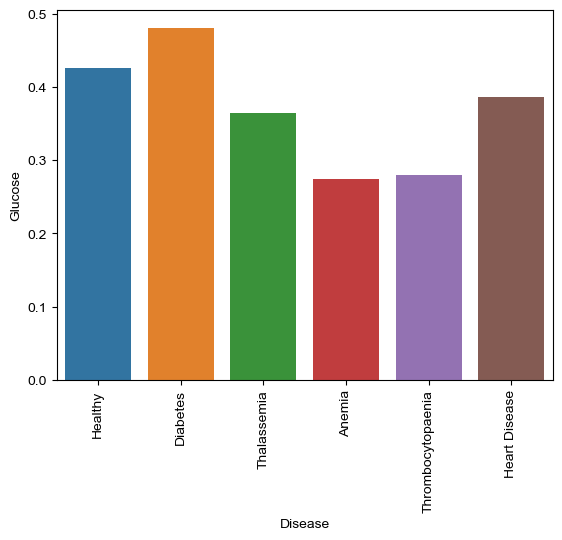

In [21]:
#sample bar chart for Glucose value with mean
sns.barplot(x='Disease',y='Glucose', data = df, 
            hue='Disease', 
            errorbar=None,
            estimator=np.mean)
sns.set_style("darkgrid")
plt.xticks(rotation=90)
plt.show()

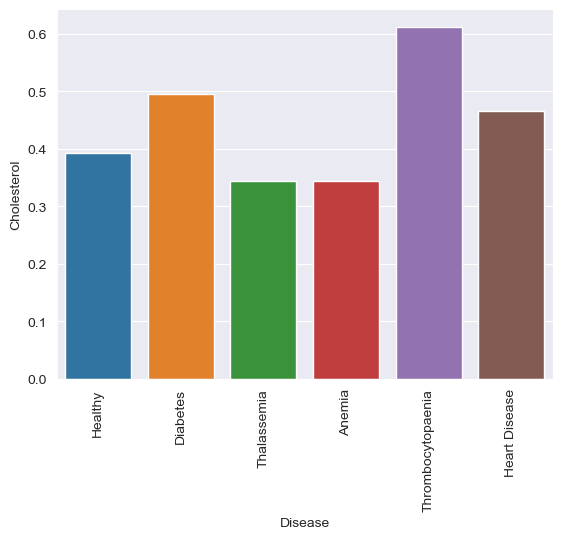

In [22]:
sns.barplot(x='Disease',y='Cholesterol', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

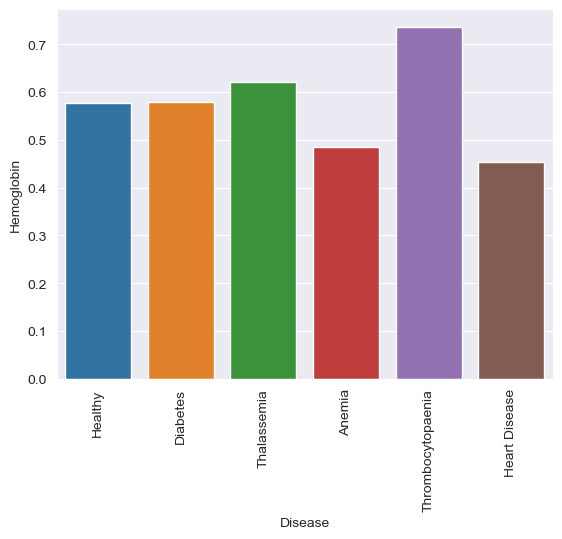

In [23]:
sns.barplot(x='Disease',y='Hemoglobin', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

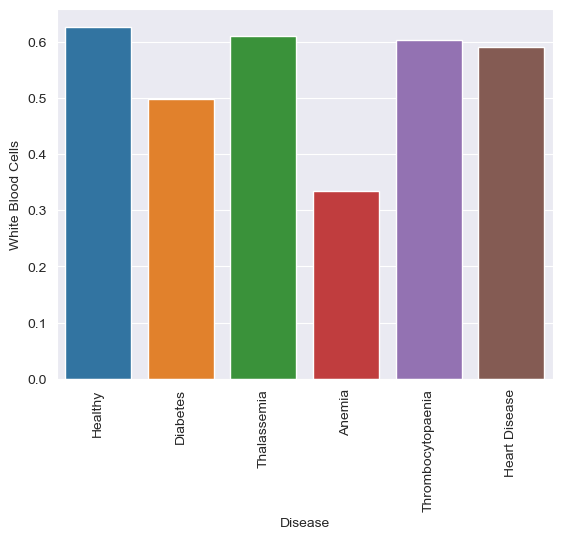

In [24]:
sns.barplot(x='Disease',y='White Blood Cells', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

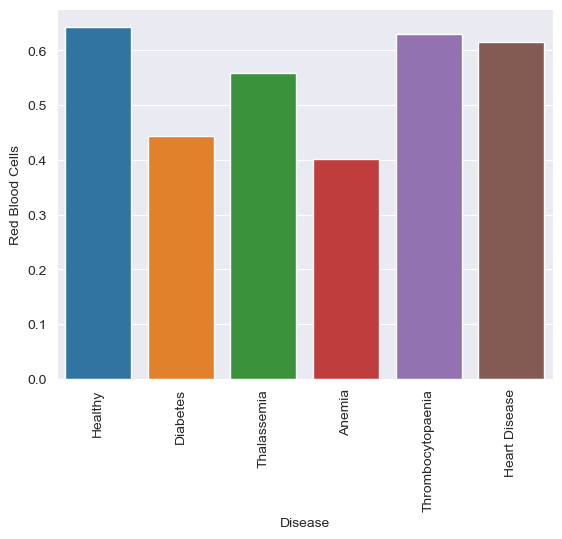

In [25]:
sns.barplot(x='Disease',y='Red Blood Cells', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

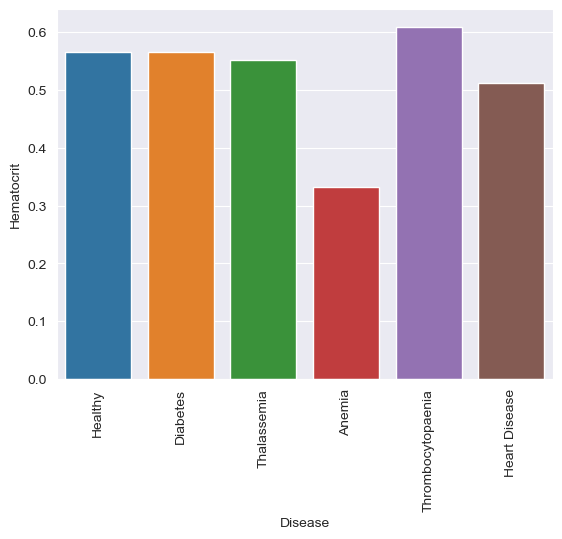

In [26]:
sns.barplot(x='Disease',y='Hematocrit', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

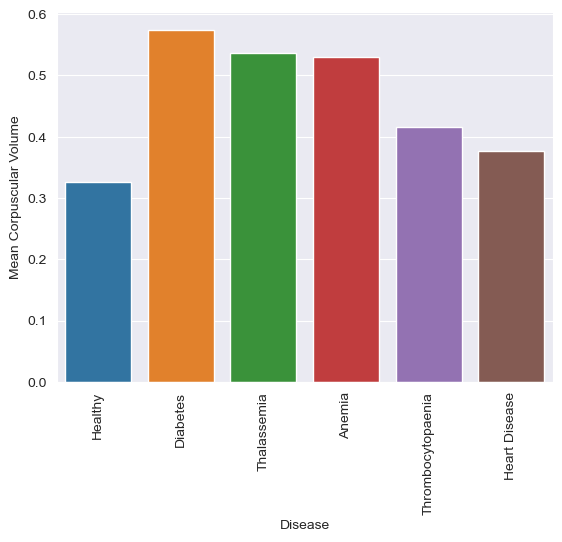

In [27]:
sns.barplot(x='Disease',y='Mean Corpuscular Volume', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

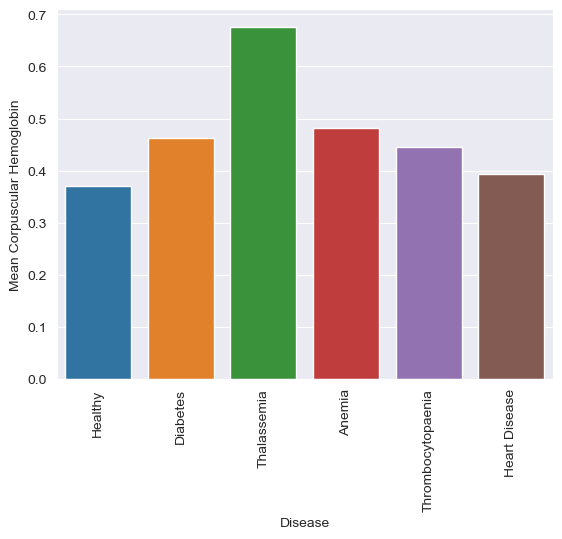

In [28]:
sns.barplot(x='Disease',y='Mean Corpuscular Hemoglobin', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

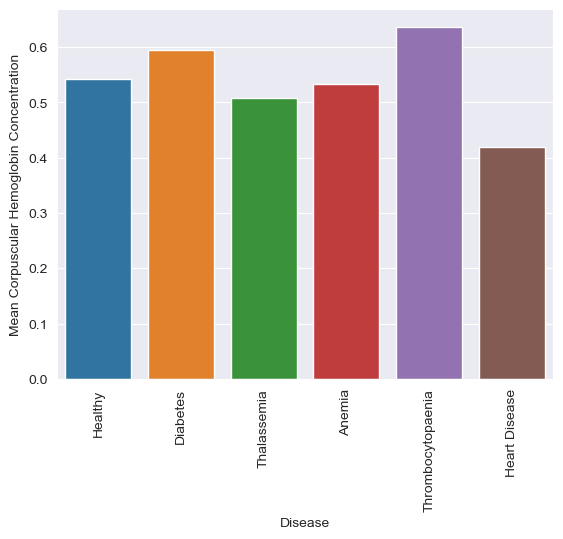

In [29]:
sns.barplot(x='Disease',y='Mean Corpuscular Hemoglobin Concentration', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

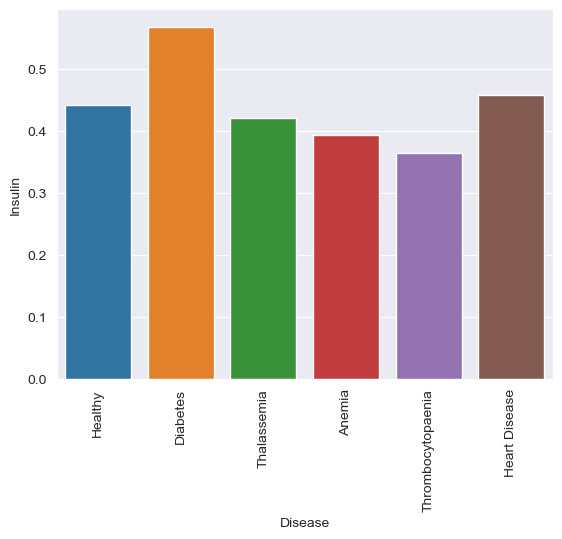

In [30]:
sns.barplot(x='Disease',y='Insulin', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

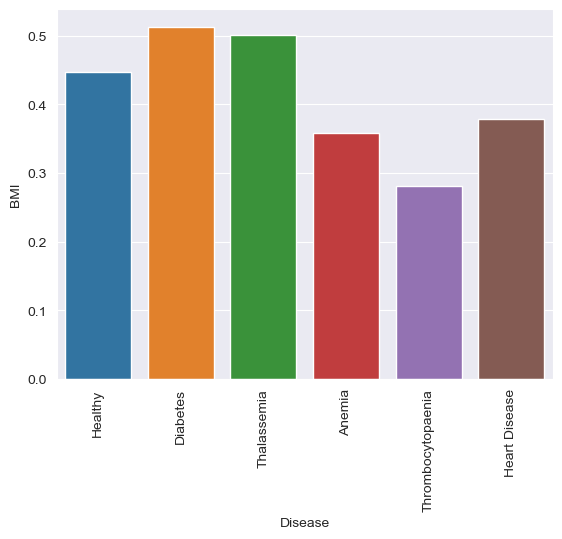

In [31]:
sns.barplot(x='Disease',y='BMI', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

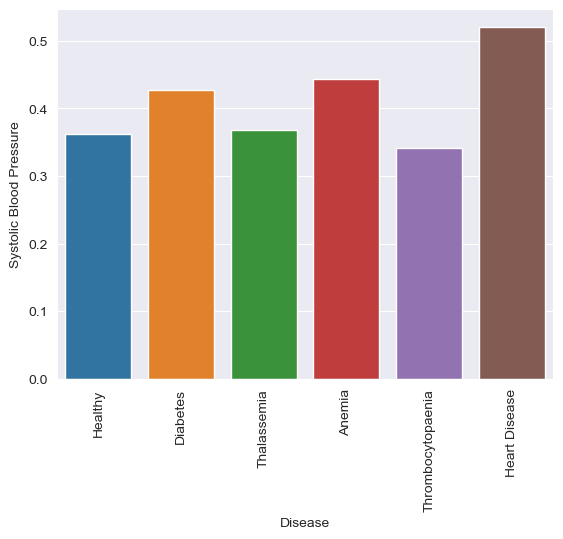

In [32]:
sns.barplot(x='Disease',y='Systolic Blood Pressure', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

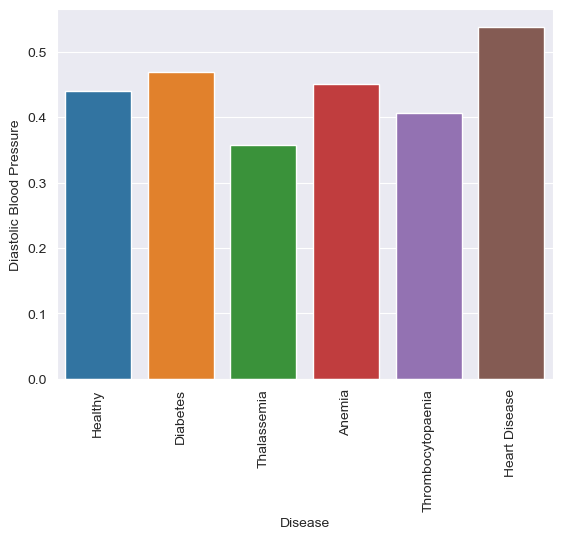

In [33]:
sns.barplot(x='Disease',y='Diastolic Blood Pressure', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

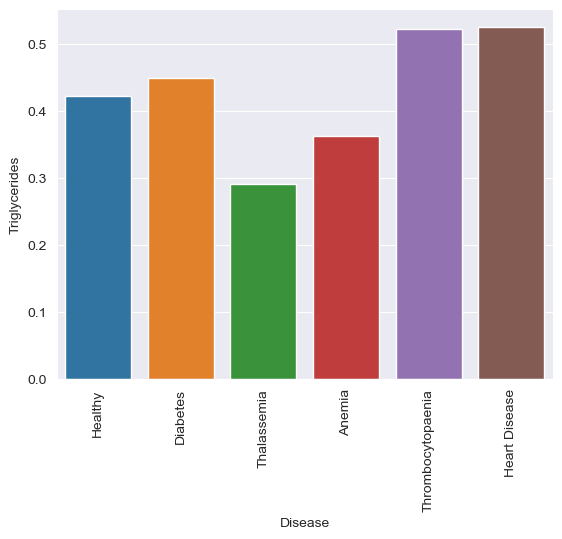

In [34]:
sns.barplot(x='Disease',y='Triglycerides', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

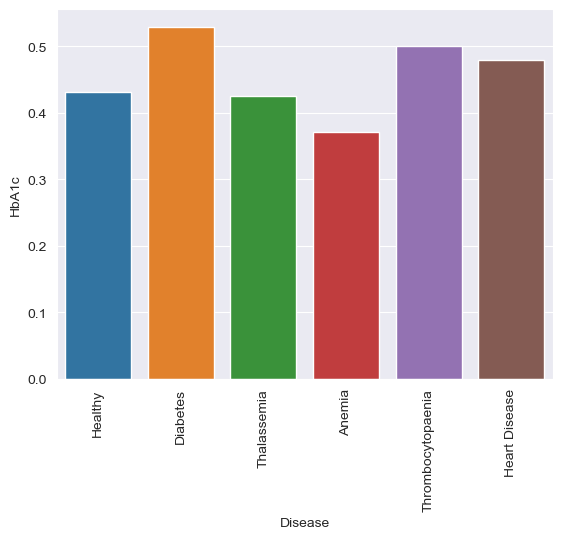

In [35]:
sns.barplot(x='Disease',y='HbA1c', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

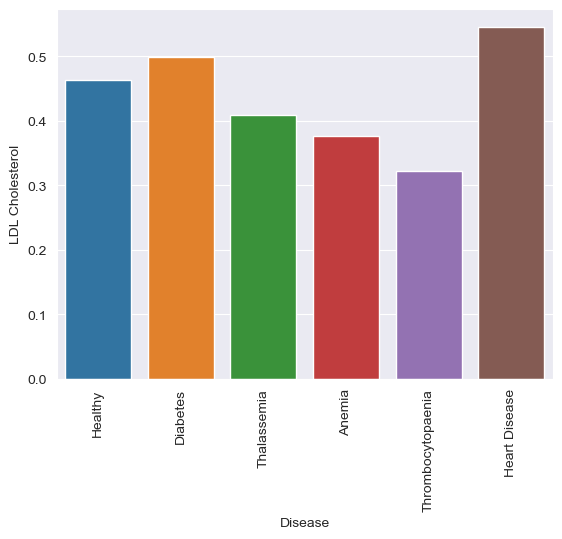

In [36]:
sns.barplot(x='Disease',y='LDL Cholesterol', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

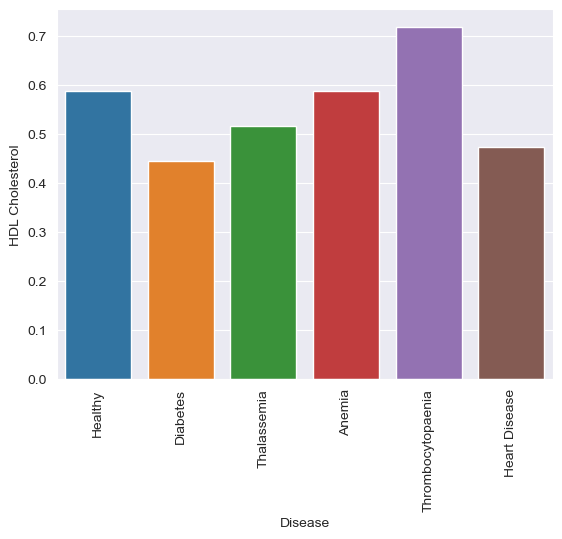

In [37]:
sns.barplot(x='Disease',y='HDL Cholesterol', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

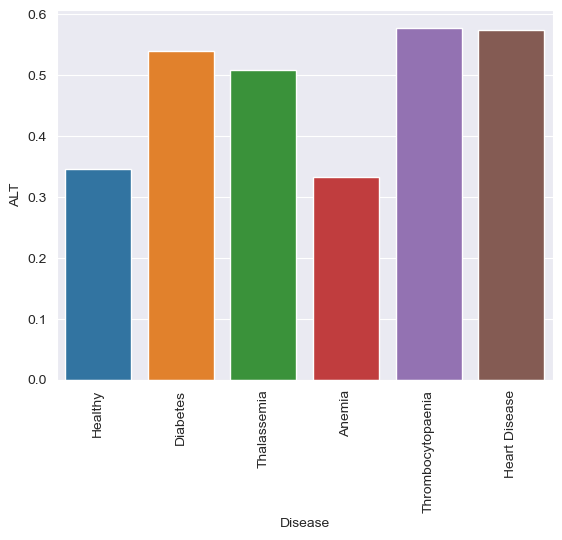

In [38]:
sns.barplot(x='Disease',y='ALT', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

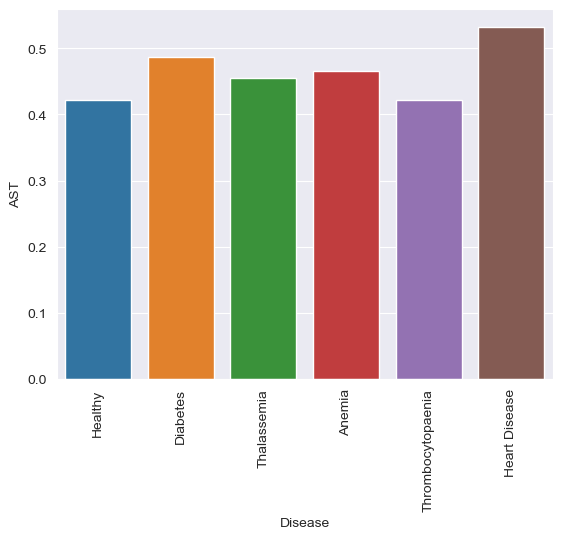

In [39]:
sns.barplot(x='Disease',y='AST', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

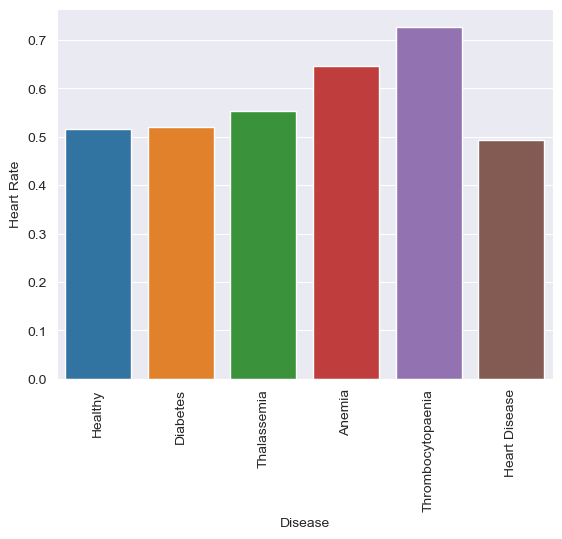

In [40]:
sns.barplot(x='Disease',y='Heart Rate', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

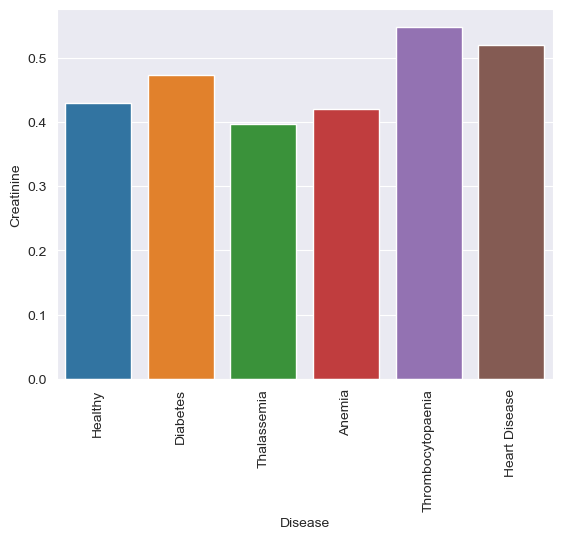

In [41]:
sns.barplot(x='Disease',y='Creatinine', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

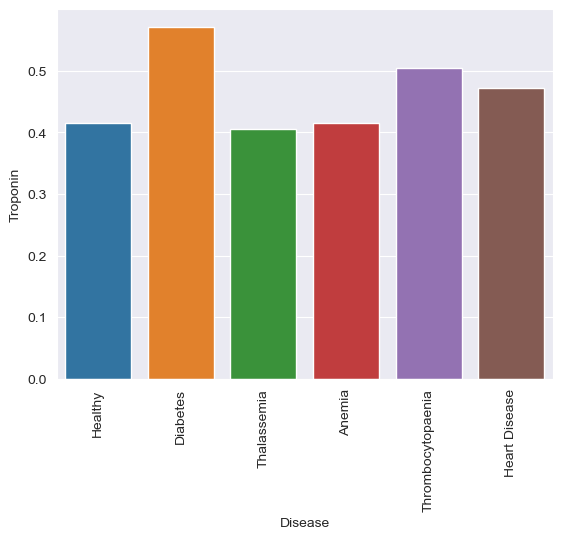

In [42]:
sns.barplot(x='Disease',y='Troponin', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

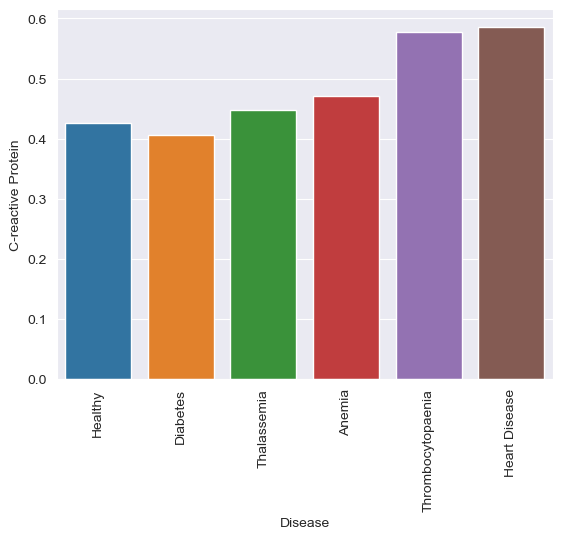

In [43]:
sns.barplot(x='Disease',y='C-reactive Protein', data = df, 
            hue='Disease',
            errorbar = None,
            estimator=np.mean)
plt.xticks(rotation=90)
plt.show()

In [44]:
#distplot - A Distplot or distribution plot, depicts the variation in the data distribution. 
# Seaborn Distplot represents the overall distribution of continuous data variables. 

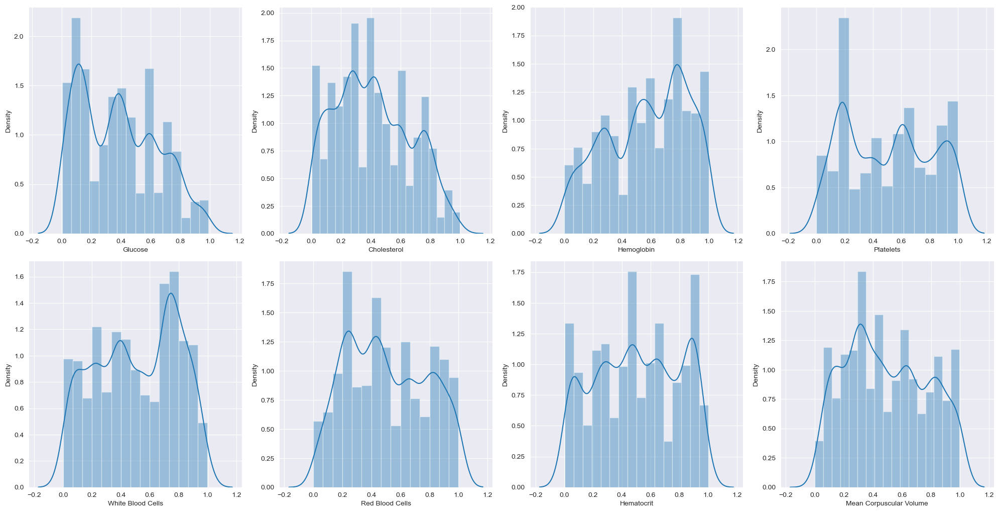

In [45]:
plt.figure(figsize = (20, 20))
plotnumber = 1
for column in df.columns[0:8]:
    if plotnumber <= 8:
        ax = plt.subplot(4, 4, plotnumber)
        sns.distplot(df[column], kde=True)
        plt.tight_layout()

    plotnumber += 1

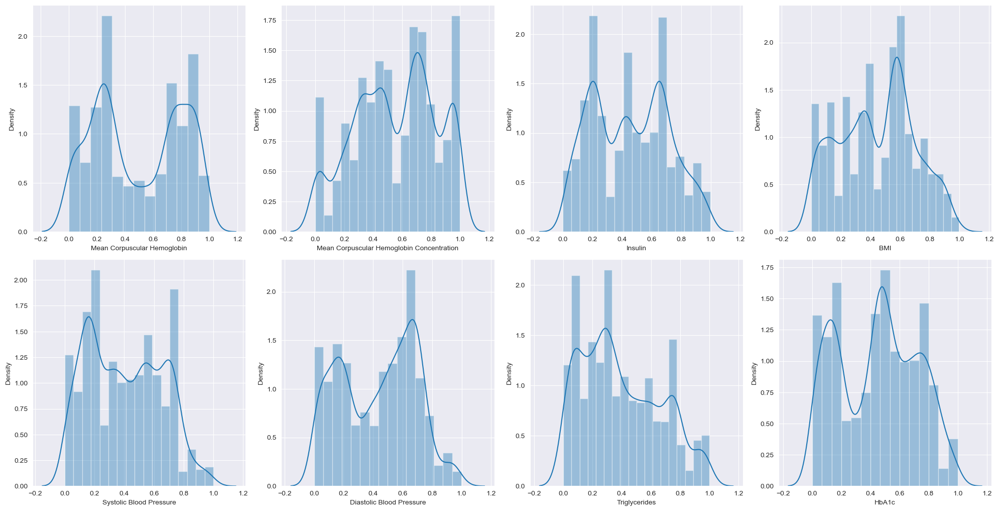

In [46]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[8:16]:
    if plotnumber <= 8:
        ax = plt.subplot(4, 4, plotnumber)
        sns.distplot(df[column], kde=True)
        plt.tight_layout()

    plotnumber += 1

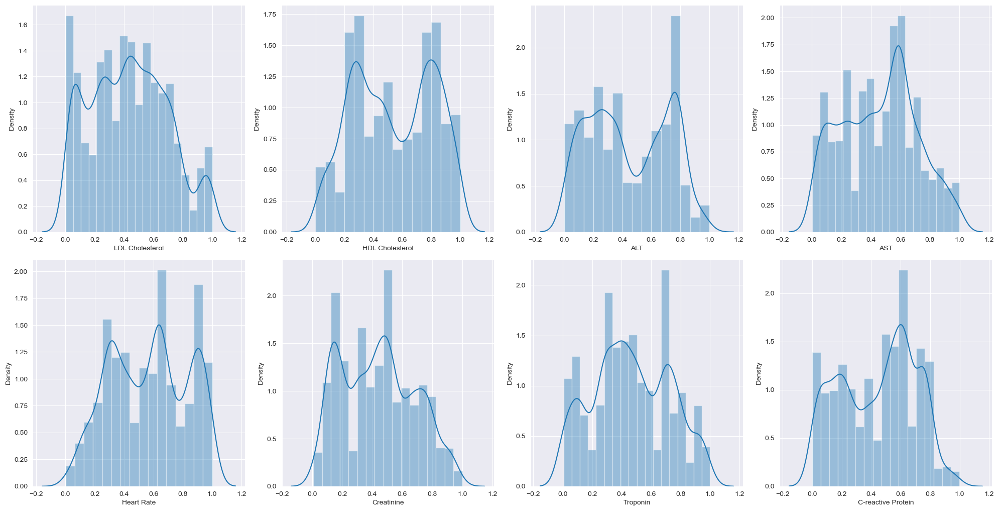

In [47]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[16:24]:
    if plotnumber <= 8:
        ax = plt.subplot(4, 4, plotnumber)
        sns.distplot(df[column], kde=True)
        plt.tight_layout()

    plotnumber += 1

In [48]:
#Joint Plot - A Jointplot is a figure that showcases the relationship between two variables, combining scatter plots, hexbin plots, regression plots, 
# or 2D kernel density plots with histograms, KDE (Kernel Density Estimate) plots, or other representations of the univariate distribution of each variable on the margins

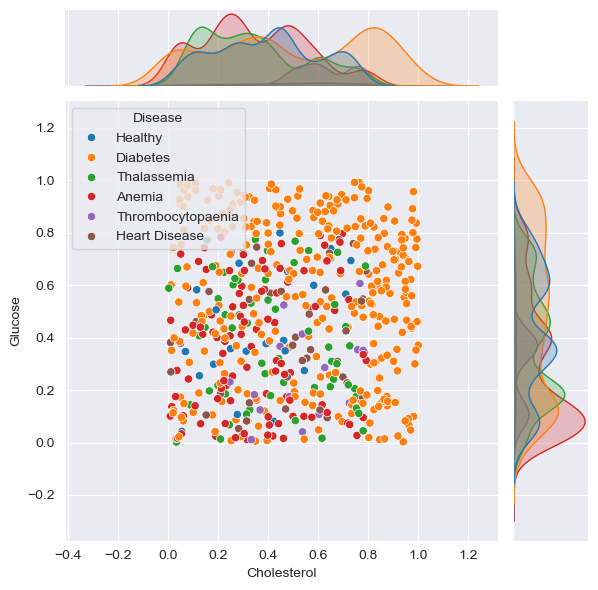

In [49]:
sns.jointplot(x='Cholesterol',y='Glucose',data=df,hue='Disease')
plt.show()

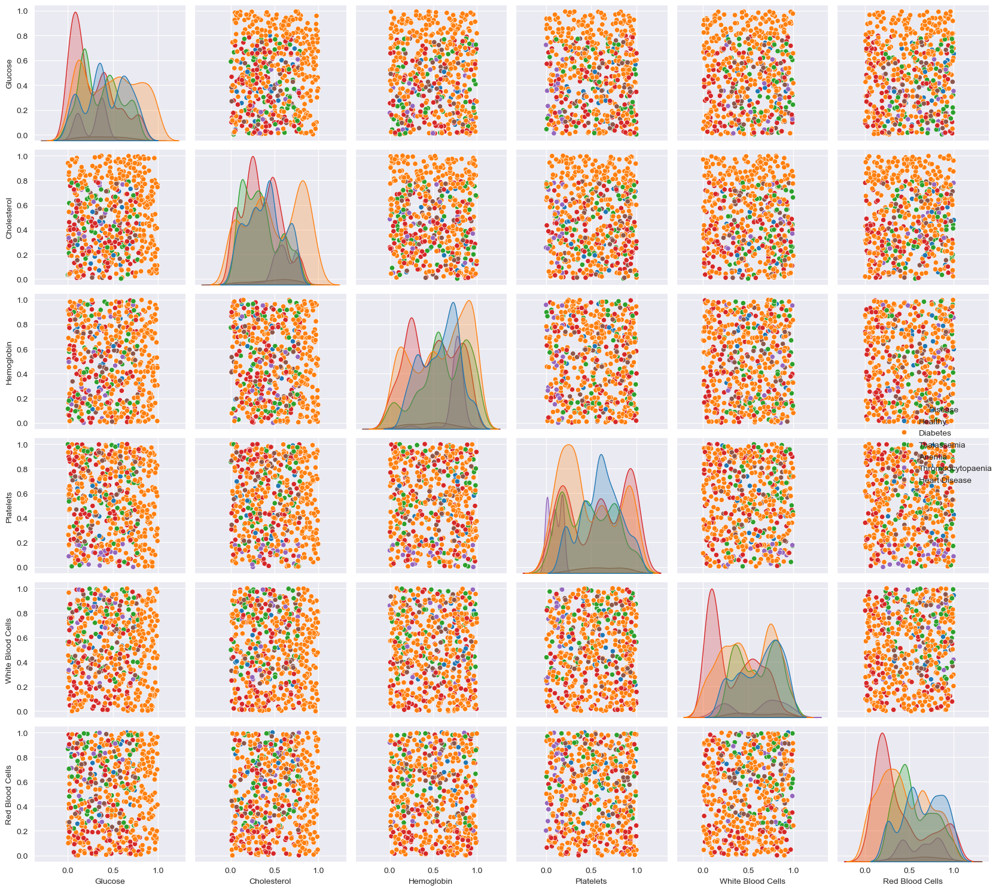

In [50]:
sns.pairplot(df, vars=df.columns[0:6], hue=df.columns[-1], diag_kind='kde')
plt.tight_layout()
plt.show()

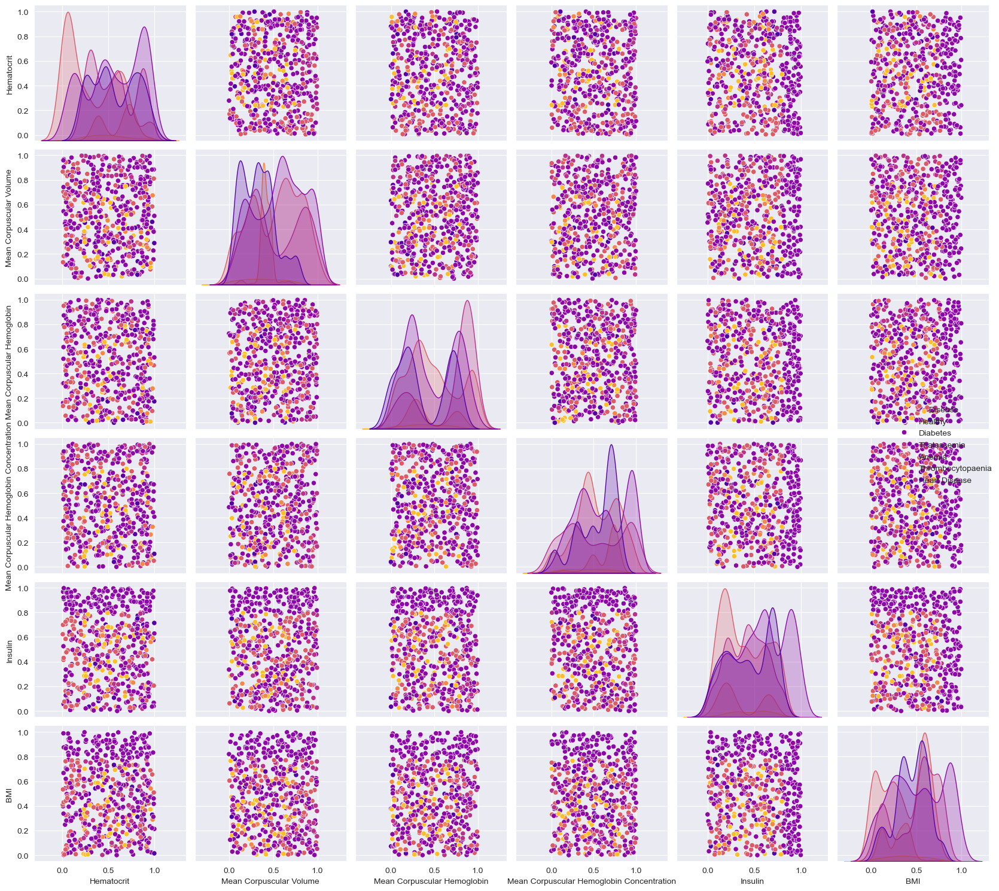

In [51]:
sns.pairplot(df, vars=df.columns[6:12], hue=df.columns[-1], palette='plasma')
plt.tight_layout()
plt.show()

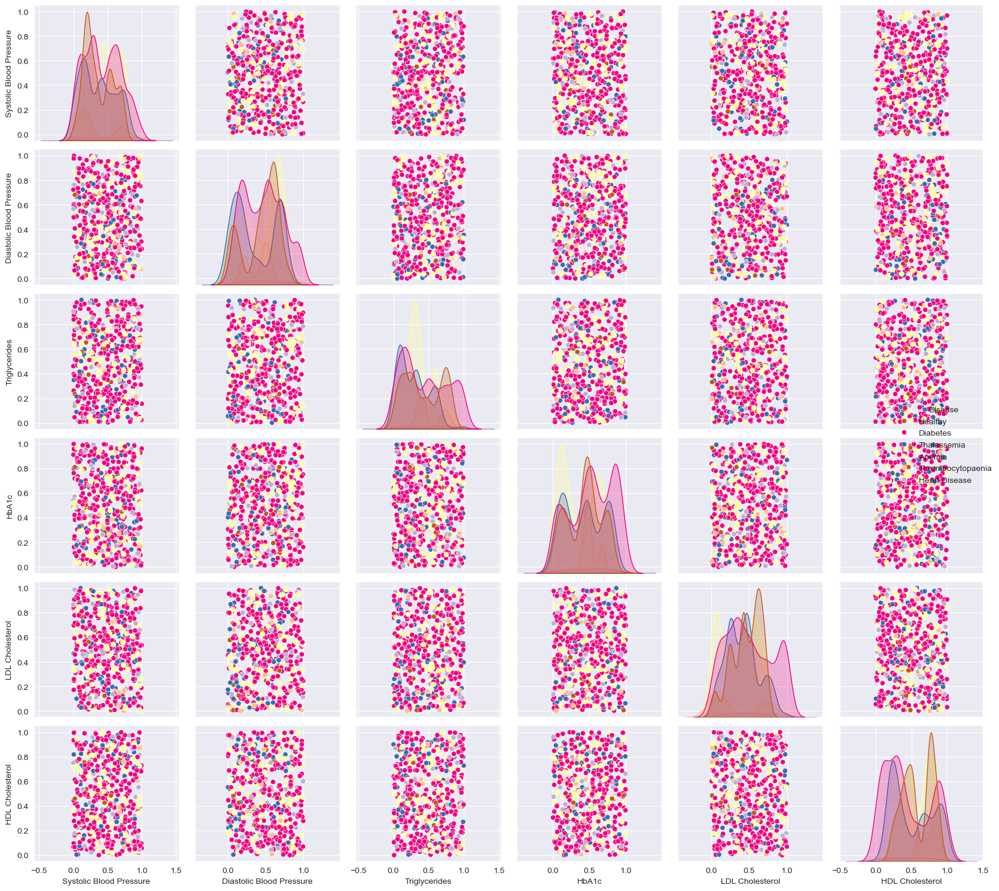

In [52]:
sns.pairplot(df, vars=df.columns[12:18], hue=df.columns[-1], palette='Accent_r')
plt.tight_layout()
plt.show()

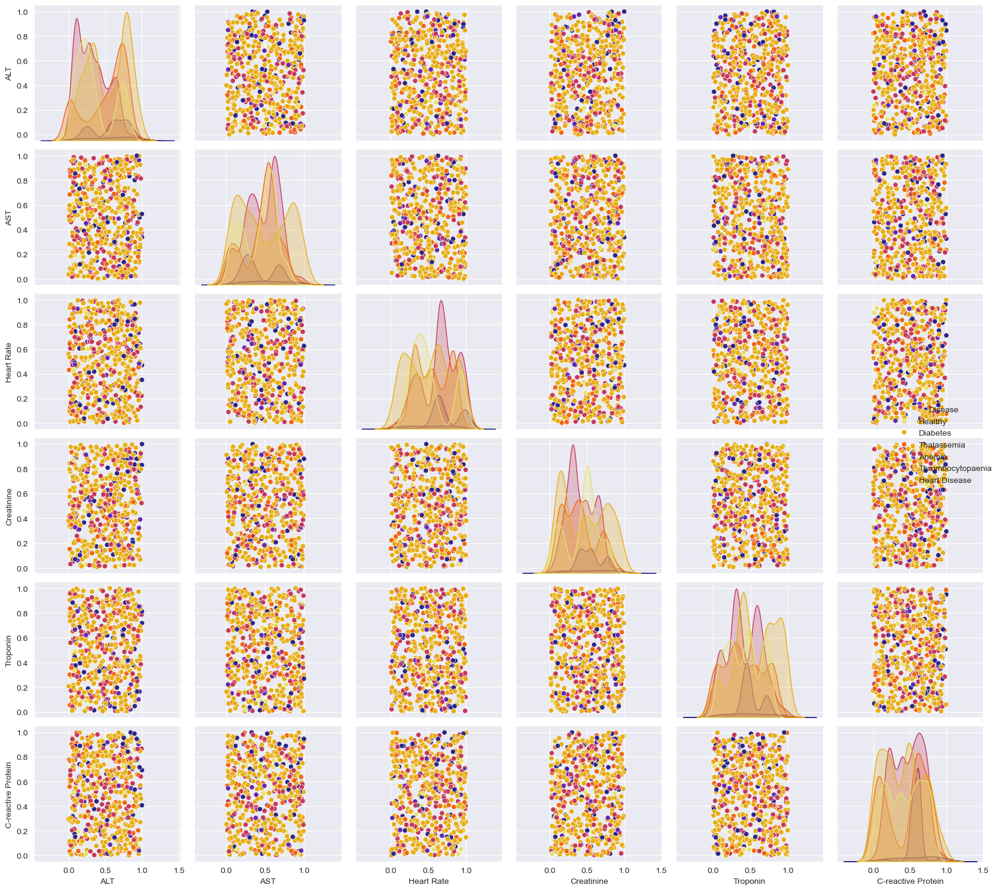

In [53]:
sns.pairplot(df, vars=df.columns[18:24], hue=df.columns[-1],palette='CMRmap_r')
plt.tight_layout()
plt.show()

In [54]:
# distribution based on their median and checking for outliers
df.groupby('Disease').Hemoglobin.describe()

,count,mean,std,min,25%,50%,75%,max
Disease,,,,,,,,
Anemia,707.0,0.484634,0.275225,0.003021,0.242045,0.493573,0.743529,0.993834
Diabetes,834.0,0.578740,0.314010,0.004819,0.289345,0.651926,0.877755,0.997876
Healthy,561.0,0.576258,0.214472,0.111304,0.360497,0.597916,0.747859,0.964963
Heart Disease,39.0,0.454361,0.227784,0.011107,0.225629,0.491644,0.596335,0.934751
Thalassemia,557.0,0.620132,0.278630,0.026720,0.487907,0.609836,0.851987,0.987033
Thrombocytopaenia,139.0,0.736443,0.149753,0.000719,0.755007,0.777394,0.791215,0.957512


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

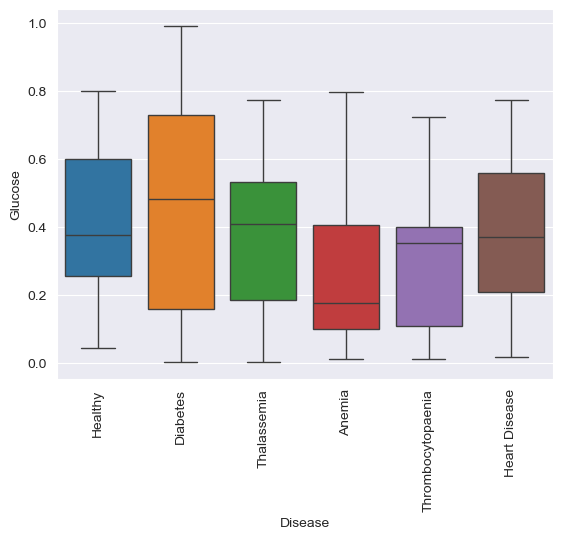

In [55]:
sns.boxplot(x='Disease', y='Glucose', data=df , hue = 'Disease') 
plt.xticks(rotation=90)

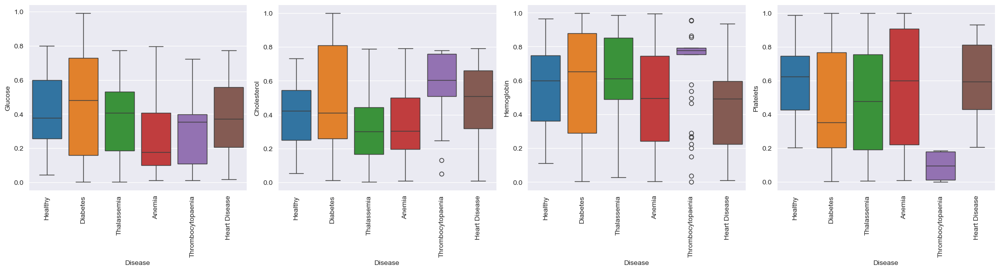

In [56]:
plt.figure(figsize = (20, 20))
plt.xticks(rotation=90)
plotnumber = 1
for column in df.columns[0:5]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

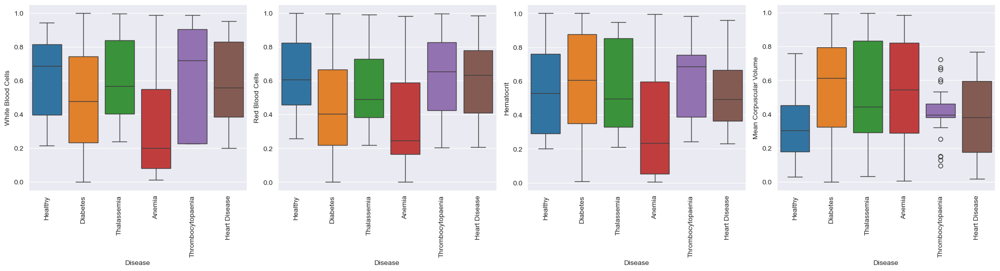

In [57]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[4:8]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

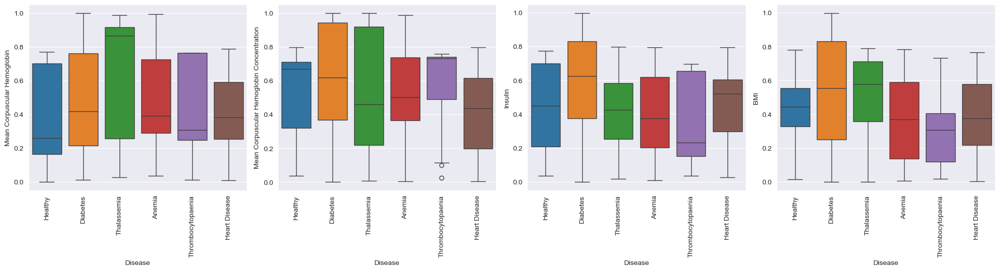

In [58]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[8:12]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

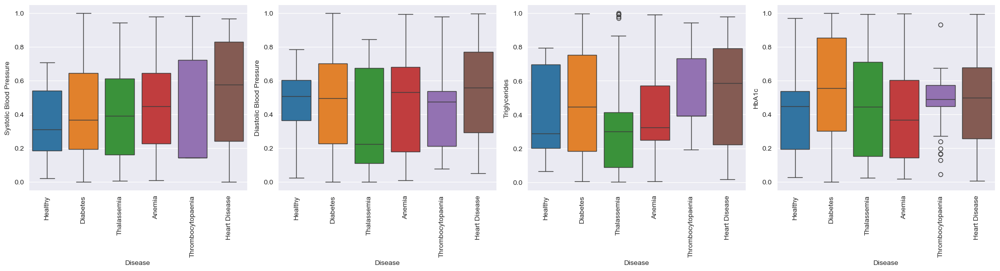

In [59]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[12:16]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

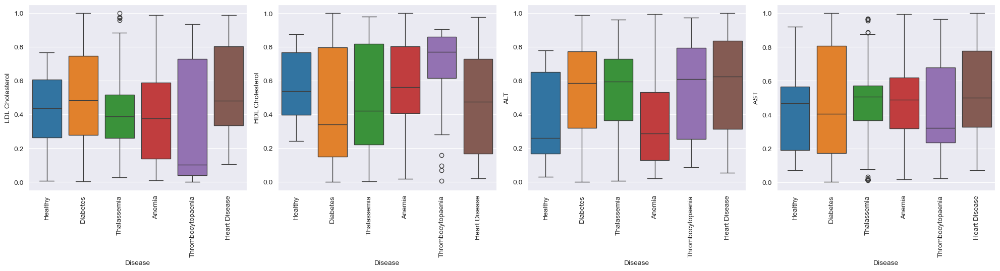

In [60]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[16:20]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

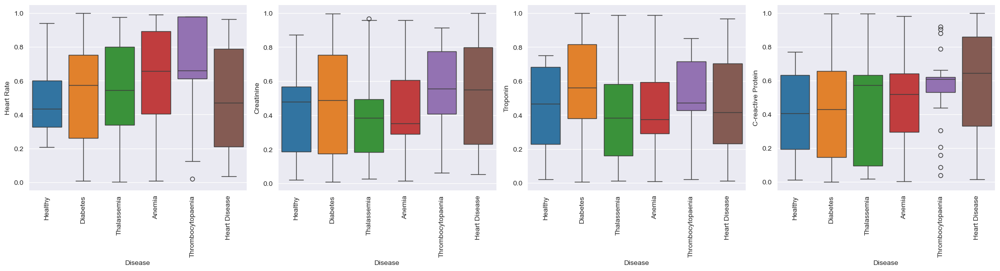

In [61]:
plt.figure(figsize = (20, 20))

plotnumber = 1
for column in df.columns[20:24]:
    if plotnumber <= 4:
        ax = plt.subplot(4, 4, plotnumber)
        sns.boxplot(x='Disease', y = column, data=df, hue = 'Disease')
        plt.tight_layout()
        plt.xticks(rotation=90)
    plotnumber += 1

In [62]:
columns_to_plot = df.drop(['Disease'],axis=1)
columns_to_plot

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,Triglycerides,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.653472,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.477742,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.088940,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.406528,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.414407,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2832,0.985163,0.412960,0.529993,0.263765,0.431288,0.198882,0.581289,0.701192,0.249410,0.246893,...,0.763585,0.680556,0.048191,0.465272,0.066511,0.965544,0.015051,0.442730,0.196986,0.816038
2833,0.581914,0.629325,0.491644,0.901473,0.347797,0.633286,0.698114,0.516947,0.674259,0.798153,...,0.797147,0.261767,0.482322,0.799523,0.807460,0.325313,0.825194,0.777866,0.415987,0.842804
2834,0.066669,0.404558,0.591041,0.228401,0.127461,0.026670,0.847444,0.279740,0.575425,0.156438,...,0.034523,0.168146,0.763625,0.677782,0.890501,0.638825,0.559993,0.795478,0.669925,0.124874
2835,0.901444,0.430680,0.243853,0.825551,0.493884,0.726299,0.660930,0.445560,0.349782,0.343069,...,0.366494,0.893448,0.500059,0.112250,0.548469,0.211496,0.938355,0.463381,0.862921,0.658526


In [63]:
df.groupby('Disease').Glucose.describe()

,count,mean,std,min,25%,50%,75%,max
Disease,,,,,,,,
Anemia,707.0,0.274186,0.235978,0.010994,0.099702,0.175103,0.407043,0.796288
Diabetes,834.0,0.480730,0.299962,0.002710,0.158868,0.480944,0.729868,0.991742
Healthy,561.0,0.426264,0.233164,0.042563,0.254839,0.377112,0.599549,0.799282
Heart Disease,39.0,0.386484,0.218704,0.017119,0.207115,0.370998,0.558384,0.773692
Thalassemia,557.0,0.364874,0.218495,0.001827,0.185553,0.407101,0.531424,0.774055
Thrombocytopaenia,139.0,0.280213,0.139633,0.011153,0.107165,0.353734,0.399017,0.723057


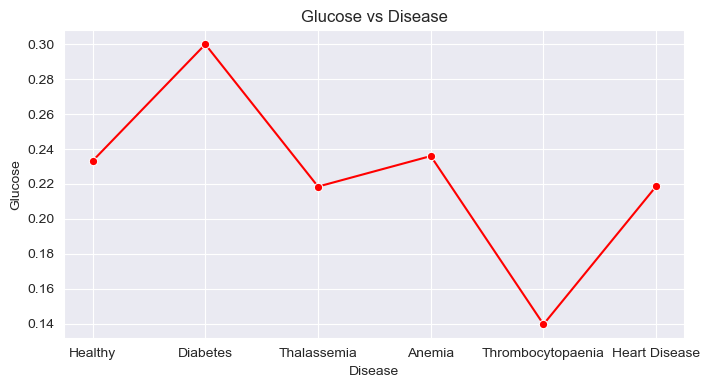

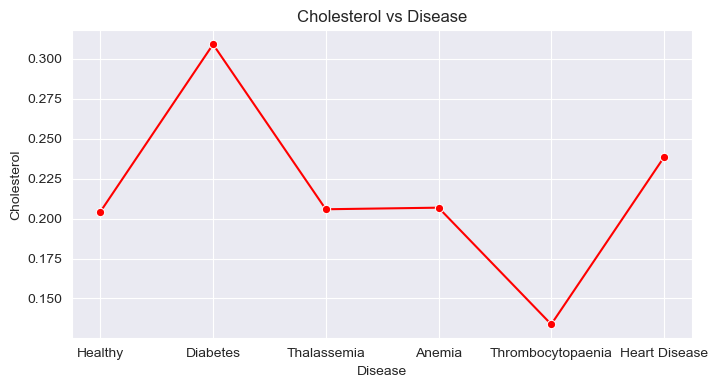

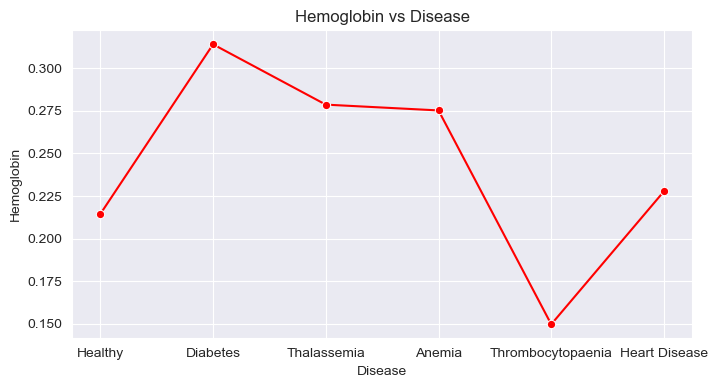

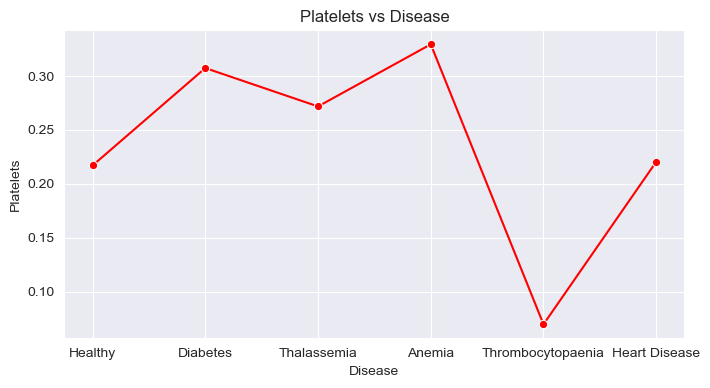

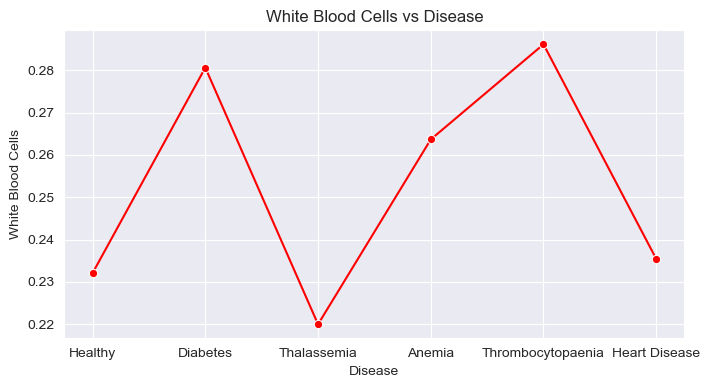

...

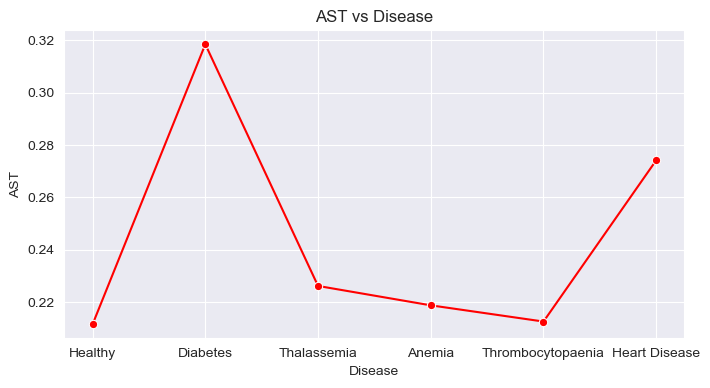

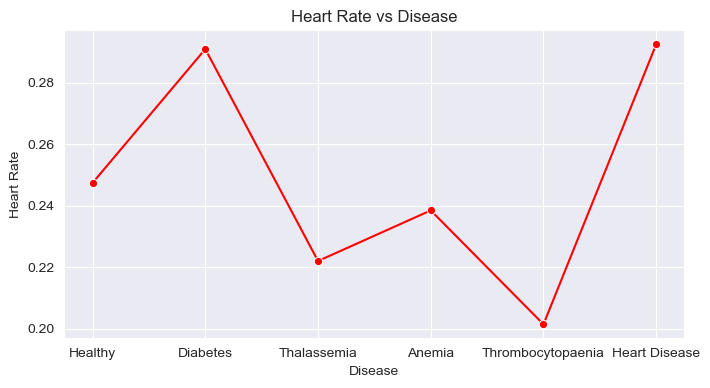

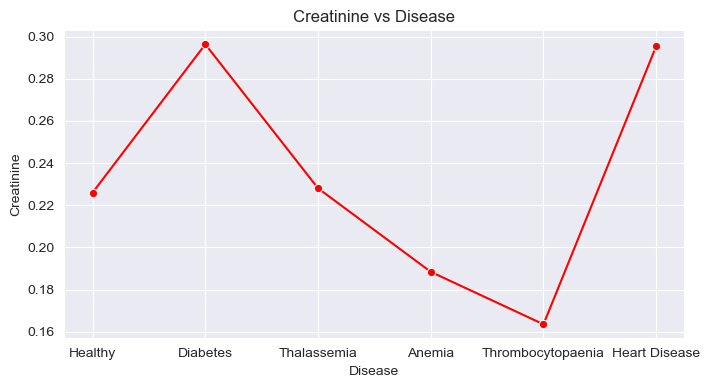

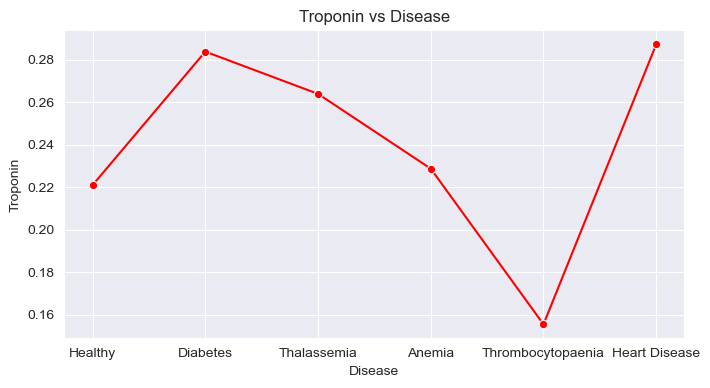

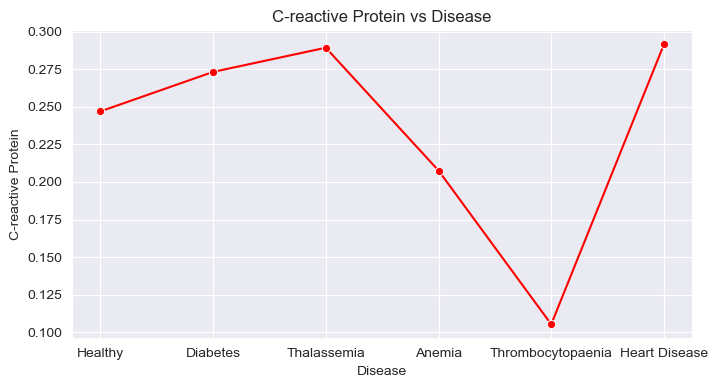

In [64]:
#line plot based on standard deviation in each case
columns_to_plot = df.drop(['Disease'],axis=1)
for column in columns_to_plot:
    plt.figure(figsize=(8, 4))  
    sns.lineplot(x='Disease', y=column, data=df, marker="o", color='red', errorbar=None, estimator = 'std')
    plt.title(f"{column} vs Disease")
    plt.show()

## Encoding
#### 	Categorical data cannot typically be directly handled by machine learning algorithms, as most algorithms are primarily designed to operate with numerical data only. 
#### Therefore, before categorical features can be used as inputs, it must be converted into numerical data for better analysis.


#### Mapping

In [65]:
mapping = {
    'Healthy': 0,
    'Diabetes': 1,
    'Thalassemia': 2,
    'Anemia': 3,
    'Thrombocytopaenia': 4,
    'Heart Disease': 5
}

In [66]:
df['Disease'] = df['Disease'].replace(mapping)

In [67]:
df.Disease.value_counts()

Disease
1    834
3    707
0    561
2    557
4    139
5     39
Name: count, dtype: int64

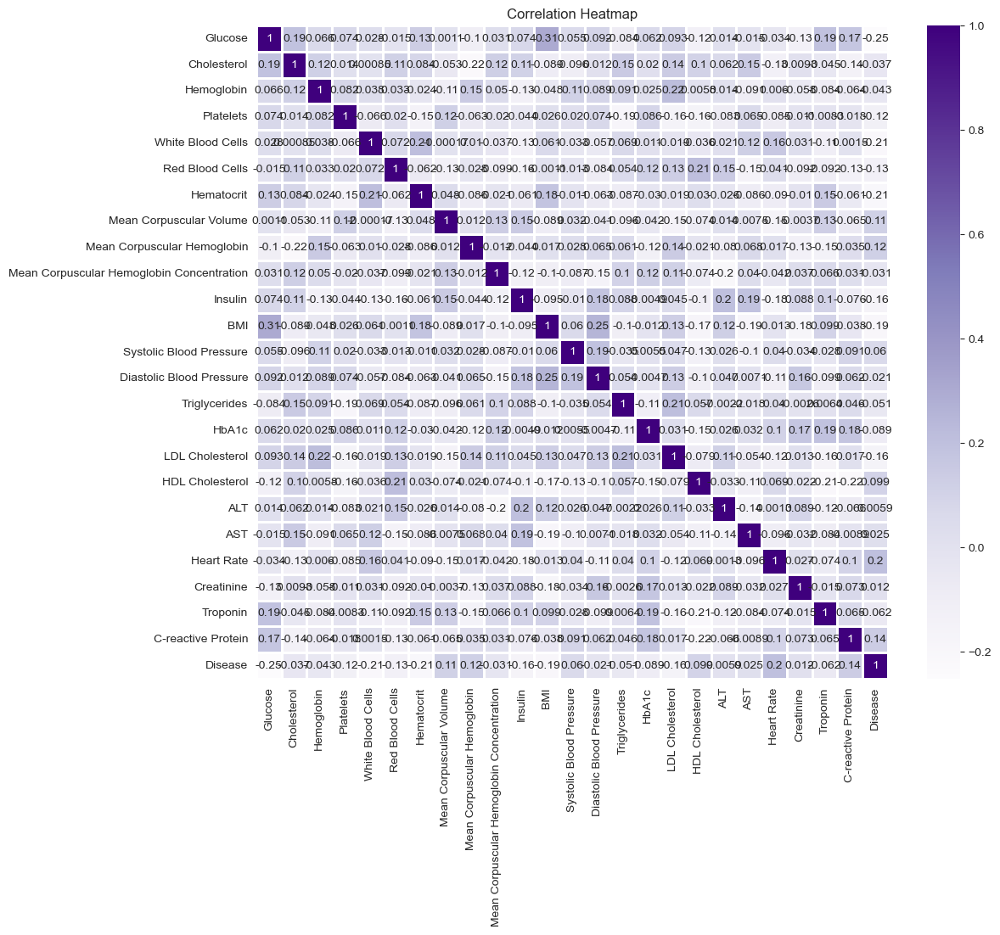

In [68]:
#correlation
heatmap_data = df[df.columns.values]

correlation_matrix = heatmap_data.corr()

plt.figure(figsize=(12, 10))

sns.heatmap(correlation_matrix, annot=True, cmap='Purples', linewidths=1)

plt.title('Correlation Heatmap')
plt.show()

#### Splitting into independent and dependent features

In [69]:
x = df.drop(columns='Disease',axis=1)
y = df['Disease']

In [70]:
x

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,Triglycerides,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.653472,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.477742,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.088940,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.406528,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.414407,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2832,0.985163,0.412960,0.529993,0.263765,0.431288,0.198882,0.581289,0.701192,0.249410,0.246893,...,0.763585,0.680556,0.048191,0.465272,0.066511,0.965544,0.015051,0.442730,0.196986,0.816038
2833,0.581914,0.629325,0.491644,0.901473,0.347797,0.633286,0.698114,0.516947,0.674259,0.798153,...,0.797147,0.261767,0.482322,0.799523,0.807460,0.325313,0.825194,0.777866,0.415987,0.842804
2834,0.066669,0.404558,0.591041,0.228401,0.127461,0.026670,0.847444,0.279740,0.575425,0.156438,...,0.034523,0.168146,0.763625,0.677782,0.890501,0.638825,0.559993,0.795478,0.669925,0.124874
2835,0.901444,0.430680,0.243853,0.825551,0.493884,0.726299,0.660930,0.445560,0.349782,0.343069,...,0.366494,0.893448,0.500059,0.112250,0.548469,0.211496,0.938355,0.463381,0.862921,0.658526


In [71]:
y

0       0
1       1
2       2
3       3
4       2
       ..
2832    1
2833    5
2834    3
2835    1
2836    1
Name: Disease, Length: 2837, dtype: int64

#### Scaling

In [72]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X = scaler.fit_transform(x)

In [73]:
X

array([[ 1.35469484,  0.94496806,  0.51886542, ..., -1.42279668,
         0.00714342,  1.27535729],
       [-1.00305554, -1.55380842,  1.34818277, ...,  0.90089575,
         1.35844594, -0.17341009],
       [ 0.25919642, -1.1829544 , -0.08743154, ..., -0.09598008,
         1.28950759,  1.31463188],
       ...,
       [-1.21339923, -0.03376   ,  0.07925318, ...,  1.46339032,
         0.79233493, -1.26094611],
       [ 1.97235136,  0.07032089, -1.16577976, ...,  0.09404838,
         1.53529088,  0.8396062 ],
       [ 1.88254638,  0.73622898,  0.57914298, ..., -1.3849635 ,
        -1.57417557, -1.5582582 ]])

In [74]:
from sklearn.model_selection import train_test_split
# using the train test split function 
X_train, X_test, y_train, y_test = train_test_split(X,y , 
                                   random_state=104,  
                                   test_size=0.25,  
                                   shuffle=True) 

In [75]:
print('X_train : ',X_train.shape)  
print('') 
print('X_test : ',X_test.shape) 
print('') 
print('y_train : ',y_train.shape)  
print('') 
print('y_test : ',y_test.shape) 


X_train :  (2127, 24)

X_test :  (710, 24)

y_train :  (2127,)

y_test :  (710,)
